In [3]:
import pandas as pd
%pylab
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import seaborn as sns
sns.set()
import scipy as sp
import scipy.stats
import statsmodels.stats.api as sms
import statsmodels.api as sm
import statsmodels.formula.api as smf
import numpy as np
df=pd.read_csv('conversion_data.csv')

Using matplotlib backend: MacOSX
Populating the interactive namespace from numpy and matplotlib


/Users/yiyuanfeng/anaconda/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


# data manipulating

In [5]:
import numpy as np
l=np.array(df['total_pages_visited'])
l=1/l
df['page_visit_time']=l

In [10]:
df.isnull().sum()
df.to_csv('converson_manipulated.csv')

## cross validation

In [20]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn import svm
data=[0,1,2,3,4,6]
target=[5]

X_train, X_test, y_train, y_test = train_test_split(df.iloc[:,data], df.iloc[:,target], test_size=0.4, random_state=0)


In [21]:
X_train.shape

(189720, 6)

In [23]:
print('X_train' + ' ' + str(X_train.shape[0]))
print('X_test' + ' ' + str(X_test.shape[0]))
print('y_train' + ' ' + str(y_train.shape[0]))
print('y_test' + ' ' + str(y_test.shape[0]))

X_train 189720
X_test 126480
y_train 189720
y_test 126480


# logit regression

In [26]:
from scipy import stats
stats.chisqprob = lambda chisq, df: stats.chi2.sf(chisq, df)
logit_data = pd.concat([X_train, y_train], axis=1)
logit_model = smf.logit('converted ~ age + C(new_user) + total_pages_visited + country + source', data=logit_data).fit()
logit_model.summary()


Optimization terminated successfully.
         Current function value: 0.039946
         Iterations 11


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              converted   No. Observations:               189720
Model:                          Logit   Df Residuals:                   189711
Method:                           MLE   Df Model:                            8
Date:                Tue, 17 Jul 2018   Pseudo R-squ.:                  0.7176
Time:                        21:33:38   Log-Likelihood:                -7578.6
converged:                       True   LL-Null:                       -26839.
                                        LLR p-value:                     0.000
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept             -10.5761      0.200    -52.776      0.000     -10.969     -10.183
C(new_user)[T.1]       -1.6661      0.046    -36.211      0.000      -1.756      -1.576
country[T.Germany]      4.0193      0.176     22.835      0.000       3.674       4.364
country[T.UK]           3.7873      0.162     23.435      0.000       3.471       4.104
country[T.US]           3.4168      0.157     21.765      0.000       3.109       3.724
source[T.Direct]       -0.2009      0.063     -3.168      0.002      -0.325      -0.077
source[T.Seo]          -0.0164      0.052     -0.315      0.753      -0.118       0.086
age                    -0.0754      0.003    -24.429      0.000      -0.081      -0.069
total_pages_visited     0.7629      0.008     94.036      0.000       0.747       0.779
=======================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [31]:
from sklearn.metrics import mean_squared_error
y_predict = logit_model.predict(X_test)
mse = mean_squared_error(y_test, y_predict)
print('logit_regression_mse = ' + str(mse))

logit_regression_mse = 0.011172978941745978


# random tree

In [122]:
import h2o
from h2o.estimators import H2ORandomForestEstimator, H2OGeneralizedLinearEstimator
from h2o.model import H2OBinomialModel

In [123]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O cluster uptime:,6 days 1 hour 33 mins
H2O cluster timezone:,America/New_York
H2O data parsing timezone:,UTC
H2O cluster version:,3.18.0.11
H2O cluster version age:,1 month and 29 days
H2O cluster name:,H2O_from_python_yiyuanfeng_an0mz8
H2O cluster total nodes:,1
H2O cluster free memory:,1.475 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"locked, healthy"


In [126]:


data = h2o.import_file('converson_manipulated.csv')

training_columns = ['country', 'age', 'new_user', 'total_pages_visited', 'source']

response_column = 'converted'

#categorical data
data['country'] = data['country'].asfactor()
data['new_user'] = data['new_user'].asfactor()
data['source'] = data['source'].asfactor()

train, test = data.split_frame(ratios=[0.6])
# Define model
model = H2ORandomForestEstimator(ntrees=50, max_depth=20, nfolds=5)

# Train model
model.train(x=training_columns, y=response_column, training_frame=train)
# Model performance
performance = model.model_performance(test_data=test)
print (performance)

Parse progress: |█████████████████████████████████████████████████████████| 100%
drf Model Build progress: |███████████████████████████████████████████████| 100%

ModelMetricsRegression: drf
** Reported on test data. **

MSE: 0.014310680249796138
RMSE: 0.11962725546377856
MAE: 0.03710054195331205
RMSLE: 0.08008284783087198
Mean Residual Deviance: 0.014310680249796138



PartialDependencePlot progress: |█████████████████████████████████████████| 100%
PartialDependence: Partial Dependence Plot of model DRF_model_python_1531876050537_511 on column 'total_pages_visited'



total_pages_visited,mean_response,stddev_response
1.0,0.0155376,0.0113632
2.4736842,0.0155376,0.0113632
3.9473684,0.0155452,0.0113729
5.4210526,0.0155805,0.0114191
6.8947368,0.0160526,0.0119889
8.3684211,0.0172927,0.0138963
9.8421053,0.0281946,0.0266739
11.3157895,0.0525796,0.0490169
12.7894737,0.2526528,0.1348826
14.2631579,0.2868502,0.1461840


[]

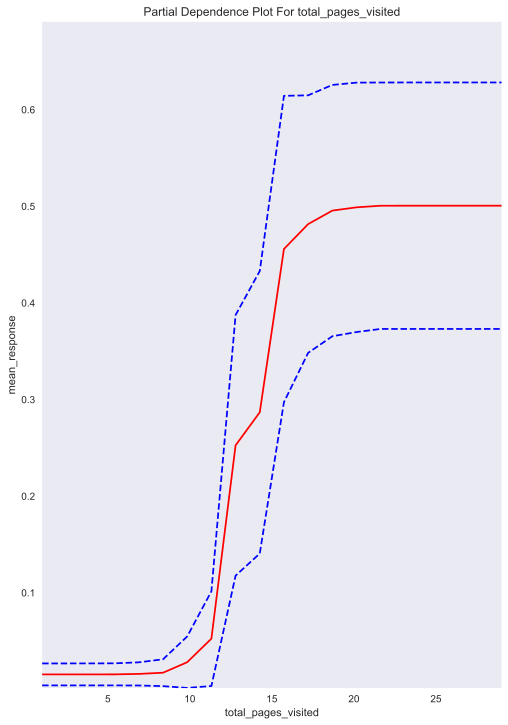

In [44]:
model.partial_plot(data, ['total_pages_visited'], destination_key=None, nbins=20, plot=True, plot_stddev=True, figsize=(7, 10), server=False)



In [129]:
model.coef_norm

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_model_python_1531876050537_517


ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.014248213147090807
RMSE: 0.11936587932525278
MAE: 0.03687541676430256
RMSLE: 0.08006868654163153
Mean Residual Deviance: 0.014248213147090807

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.014009054657370859
RMSE: 0.11835985238826069
MAE: 0.036751567109756675
RMSLE: 0.07926847618419437
Mean Residual Deviance: 0.014009054657370859
Cross-Validation Metrics Summary: 


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.0367507,0.0002724,0.0365803,0.0363751,0.0373328,0.0363920,0.0370735
mean_residual_deviance,0.0140078,0.0002784,0.0137938,0.0137496,0.0145901,0.0135543,0.0143510
mse,0.0140078,0.0002784,0.0137938,0.0137496,0.0145901,0.0135543,0.0143510
r2,0.5500629,0.0053306,0.5467423,0.5565839,0.5435932,0.5612736,0.5421213
residual_deviance,0.0140078,0.0002784,0.0137938,0.0137496,0.0145901,0.0135543,0.0143510
rmse,0.1183428,0.0011730,0.1174469,0.1172586,0.1207894,0.1164231,0.1197958
rmsle,0.0792584,0.0007407,0.0789180,0.0785076,0.0806991,0.0779284,0.0802389


Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
,2018-07-23 23:34:10,18.309 sec,0.0,nan,nan,nan
,2018-07-23 23:34:10,18.369 sec,1.0,0.1216611,0.0285663,0.0148014
,2018-07-23 23:34:10,18.426 sec,2.0,0.1326011,0.0356071,0.0175831
,2018-07-23 23:34:10,18.492 sec,3.0,0.1357077,0.0383375,0.0184166
,2018-07-23 23:34:10,18.565 sec,4.0,0.1283299,0.0351993,0.0164686
---,---,---,---,---,---,---
,2018-07-23 23:34:13,20.903 sec,46.0,0.1190261,0.0365706,0.0141672
,2018-07-23 23:34:13,20.973 sec,47.0,0.1185607,0.0363033,0.0140566
,2018-07-23 23:34:13,21.039 sec,48.0,0.1181161,0.0360375,0.0139514
,2018-07-23 23:34:13,21.091 sec,49.0,0.1187568,0.0364686,0.0141032



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
total_pages_visited,79055.7734375,1.0,0.8917806
new_user,5003.5576172,0.0632915,0.0564421
country,2740.2070312,0.0346617,0.0309106
age,1681.2593994,0.0212668,0.0189653
source,168.5595856,0.0021322,0.0019014


<bound method ModelBase.coef_norm of >

# lime

In [4]:
from __future__ import print_function
import sklearn
import sklearn.datasets
import sklearn.ensemble
import pandas as pd
import numpy as np
import lime
import lime.lime_tabular

class h2o_predict_proba_wrapper:
    # drf is the h2o distributed random forest object, the column_names is the
    # labels of the X values
    def __init__(self,model,column_names):
            
            self.model = model
            self.column_names = column_names
 
    def predict_proba(self,this_array):        
        # If we have just 1 row of data we need to reshape it
        shape_tuple = np.shape(this_array)        
        if len(shape_tuple) == 1:
            this_array = this_array.reshape(1, -1)
            
        # We convert the numpy array that Lime sends to a pandas dataframe and
        # convert the pandas dataframe to an h2o frame
        self.pandas_df = pd.DataFrame(data = this_array,columns = self.column_names)
        self.h2o_df = h2o.H2OFrame(self.pandas_df)
        
        # Predict with the h2o drf
        self.predictions = self.model.predict(self.h2o_df).as_data_frame()
        # the first column is the class labels, the rest are probabilities for
        # each class
        self.predictions = self.predictions.iloc[:,1:].as_matrix()
        return self.predictions

In [5]:
data = pd.read_csv('conversion_data.csv')

feature_names = ['country', 'age', 'new_user', 'total_pages_visited', 'source']
class_names = 'converted'

labels = np.array(data.iloc[1:,5])
le= sklearn.preprocessing.LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_

datacolumn=range(5)
data = np.array(data.iloc[1:,datacolumn]) # no label no name for column
categorical_features = [0,2,3]
categorical_names = ['country', 'new_user', 'source']
categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_
data = data.astype(float)

encoder = sklearn.preprocessing.OneHotEncoder(categorical_features=categorical_features)



train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, labels, train_size=0.80)


train_h2o_df = h2o.H2OFrame(train)
train_h2o_df.set_names(feature_names)
train_h2o_df['converted'] = h2o.H2OFrame(labels_train).asfactor()


test_h2o_df = h2o.H2OFrame(test)
test_h2o_df.set_names(feature_names)
test_h2o_df['converted'] = h2o.H2OFrame(labels_test).asfactor()



for feature in categorical_features:
    train_h2o_df[feature] = train_h2o_df[feature].asfactor()
    test_h2o_df[feature] = test_h2o_df[feature].asfactor()
    

/Users/yiyuanfeng/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


In [6]:
print(type(train_h2o_df))

<class 'h2o.frame.H2OFrame'>


In [7]:
conversion_drf = H2ORandomForestEstimator(
        model_id="conversion_drf",
        ntrees=100,
        #stopping_rounds=2,
        score_each_iteration=True,
        #seed=1000000,
        balance_classes=False,
        histogram_type="AUTO")

conversion_drf.train(x=feature_names,
         y='converted',
         training_frame=train_h2o_df)

drf Model Build progress: |███████████████████████████████████████████████| 100%


In [8]:
conversion_drf.model_performance(test_h2o_df)


ModelMetricsBinomial: drf
** Reported on test data. **

MSE: 0.012111428899254314
RMSE: 0.11005193728078717
LogLoss: 0.04709446863471287
Mean Per-Class Error: 0.07061970032638942
AUC: 0.9802109691157418
Gini: 0.9604219382314836
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4124578714668751: 


,0,1,Error,Rate
0,60795.0,371.0,0.0061,(371.0/61166.0)
1,599.0,1475.0,0.2888,(599.0/2074.0)
Total,61394.0,1846.0,0.0153,(970.0/63240.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4124579,0.7525510,172.0
max f2,0.1556947,0.7695087,251.0
max f0point5,0.6282417,0.8035486,116.0
max accuracy,0.4911181,0.9849462,150.0
max precision,0.9996721,1.0,0.0
max recall,0.0001759,1.0,398.0
max specificity,0.9996721,1.0,0.0
max absolute_mcc,0.4185294,0.7460504,170.0
max min_per_class_accuracy,0.0210416,0.9267403,340.0
max mean_per_class_accuracy,0.0323393,0.9293803,326.0


Gains/Lift Table: Avg response rate:  3.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,cumulative_response_rate,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100095,0.9633924,29.6729081,29.6729081,0.9731438,0.9731438,0.2970106,0.2970106,2867.2908088,2867.2908088
,2,0.0200032,0.7230034,25.3776717,27.5269876,0.8322785,0.9027668,0.2536162,0.5506268,2437.7671716,2652.6987624
,3,0.0300127,0.3899240,16.7150960,23.9211249,0.5481833,0.7845100,0.1673095,0.7179364,1571.5095952,2292.1124911
,4,0.0400063,0.1893231,7.7194439,19.8739066,0.2531646,0.6517787,0.0771456,0.7950820,671.9443868,1887.3906564
,5,0.05,0.1158245,5.0658850,16.9141755,0.1661392,0.5547122,0.0506268,0.8457088,406.5885038,1591.4175506
,6,0.1000949,0.0212273,1.6073646,9.2535157,0.0527146,0.3034755,0.0805207,0.9262295,60.7364630,825.3515655
,7,0.1502688,0.0068115,0.5381472,6.3435015,0.0176489,0.2080396,0.0270010,0.9532305,-46.1852826,534.3501534
,8,0.2002214,0.0031578,0.3860944,4.8572080,0.0126622,0.1592955,0.0192864,0.9725169,-61.3905625,385.7207962
,9,0.3000791,0.0017820,0.1545111,3.2922857,0.0050673,0.1079728,0.0154291,0.9879460,-84.5488883,229.2285657
,10,0.4005534,0.0014038,0.0575860,2.4808972,0.0018886,0.0813628,0.0057859,0.9937319,-94.2413969,148.0897184


In [9]:
train_pandas_df = train_h2o_df[feature_names].as_data_frame() 
train_numpy_array = train_pandas_df.as_matrix() 

test_pandas_df = test_h2o_df[feature_names].as_data_frame() 
test_numpy_array = test_pandas_df.as_matrix() 

In [10]:
categorical_names = ['country', 'new_user', 'source']
class_names = 'converted'
explainer = lime.lime_tabular.LimeTabularExplainer(train ,feature_names = feature_names,class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, kernel_width=3)
h2o_drf_wrapper = h2o_predict_proba_wrapper(conversion_drf,feature_names) 

In [11]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(test[i], h2o_drf_wrapper.predict_proba, num_features=5)


Parse progress: |█████████████████████████████████████████████████████████| 100%
drf prediction progress: |████████████████████████████████████████████████| 100%


In [12]:
exp.show_in_notebook(show_all=False)

# kmeans and plot

In [4]:
df.head()

,country,age,new_user,source,total_pages_visited,converted
0,UK,25,1,Ads,1,0
1,US,23,1,Seo,5,0
2,US,28,1,Seo,4,0
3,China,39,1,Seo,5,0
4,US,30,1,Seo,6,0


In [ ]:
#one hot encoding
from sklearn import preprocessing

enc = preprocessing.OneHotEncoder()

enc.fit([[0, 0, 3], [1, 1, 0], [0, 2, 1], [1, 0, 2]])

enc.transform([[0, 1, 3]]).toarray()

输出结果：

array([[ 1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.]])

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# for 3D projection to work
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from sklearn import datasets



In [7]:
np.random.seed(5)

data=[0,1,2,3,4]
target=[5]

X = df.iloc[:,data]
y = df.iloc[:,target]

estimators = [('k_means_8', KMeans(n_clusters=8)),
              ('k_means_3', KMeans(n_clusters=3)),
              ('k_means_bad_init', KMeans(n_clusters=3, n_init=1,
                                               init='random'))]

fignum = 1
titles = ['8 clusters', '3 clusters', '3 clusters, bad initialization']


ValueError: could not convert string to float: 'Ads'

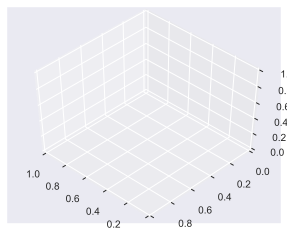

In [8]:
for name, est in estimators:
    fig = plt.figure(fignum, figsize=(4, 3))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    est.fit(X)
    labels = est.labels_

    ax.scatter(X[:, 3], X[:, 0], X[:, 2],
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Petal width')
    ax.set_ylabel('Sepal length')
    ax.set_zlabel('Petal length')
    ax.set_title(titles[fignum - 1])
    ax.dist = 12
    fignum = fignum + 1



In [ ]:
# Plot the ground truth
fig = plt.figure(fignum, figsize=(4, 3))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

for name, label in [('Setosa', 0),
                    ('Versicolour', 1),
                    ('Virginica', 2)]:
    ax.text3D(X[y == label, 3].mean(),
              X[y == label, 0].mean(),
              X[y == label, 2].mean() + 2, name,
              horizontalalignment='center',
              bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

In [ ]:
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(np.float)
ax.scatter(X[:, 3], X[:, 0], X[:, 2], c=y, edgecolor='k')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_xlabel('Petal width')
ax.set_ylabel('Sepal length')
ax.set_zlabel('Petal length')
ax.set_title('Ground Truth')
ax.dist = 12

fig.show()

# k prototype

In [18]:
import numpy as np
from kmodes.kprototypes import KPrototypes

# stocks with their market caps, sectors and countries
syms = np.genfromtxt('conversion_data.csv', dtype=str, delimiter=',')[1:, 5]
X = np.genfromtxt('conversion_data.csv', dtype=object, delimiter=',')[1:, :5]
X[:, 1] = X[:, 1].astype(float)
X[:, 4] = X[:, 4].astype(float)

kproto = KPrototypes(n_clusters=3, init='Cao', verbose=2)
clusters = kproto.fit_predict(X, categorical=[0, 2, 3])

# Print cluster centroids of the trained model.
print(kproto.cluster_centroids_)
# Print training statistics
print(kproto.cost_)
print(kproto.n_iter_)

category=[]
for s, c in zip(syms, clusters):
    category.append(c)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 72869, ncost: 10627934.857682372
Run: 1, iteration: 2/100, moves: 38386, ncost: 10146265.209245132
Run: 1, iteration: 3/100, moves: 14423, ncost: 10053247.649569107
Run: 1, iteration: 4/100, moves: 5321, ncost: 10039930.30795688
Run: 1, iteration: 5/100, moves: 14029, ncost: 9939922.882977054
Run: 1, iteration: 6/100, moves: 4679, ncost: 9929085.782499421
Run: 1, iteration: 7/100, moves: 3, ncost: 9929085.749701047
Run: 1, iteration: 8/100, moves: 0, ncost: 9929085.749701047
[array([[22.03226097,  5.06602643],
       [31.25310978,  4.81788489],
       [42.14130068,  4.68132846]]), array([[b'"US"', b'1', b'"Seo"'],
       [b'"US"', b'1', b'"Seo"'],
       [b'"US"', b'1', b'"Seo"']], dtype='|S5')]
9929085.749701047
8


# simple decision tree

In [138]:
from sklearn import tree
df=pd.read_csv('conversion_data.csv')
df = pd.get_dummies(data=df, columns=['country', 'new_user', 'source'])
x=[0,1,3,4,5,6,7,8,9,10,11]
X=df.iloc[:,x]
y=[2]
Y=df.iloc[:,y]
clf = tree.DecisionTreeClassifier(criterion = "gini",
            random_state = 100,max_depth=3, min_samples_leaf=5)
clf = clf.fit(X, Y)
import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None) 
graph = graphviz.Source(dot_data) 
#graph.render("tree")
feature_names = ['age',
 'total_pages_visited',
 'country_China',
 'country_Germany',
 'country_UK',
 'country_US',
 'new_user_0',
 'new_user_1',
 'source_Ads',
 'source_Direct',
 'source_Seo']
dot_data = tree.export_graphviz(clf, out_file=None, 
                         feature_names=feature_names,  
                         class_names='convert',  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph 

In [79]:
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.cross_validation import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
df=pd.read_csv('conversion_data.csv')
df = pd.get_dummies(data=df, columns=['country', 'new_user', 'source'])
data=[0,1,3,4,5,6,7,8,9,10,11]
target=[2]


def train_using_gini(X_train, X_test, y_train):
 
    # Creating the classifier object
    clf_gini = DecisionTreeClassifier(criterion = "gini",
            random_state = 100,max_depth=3, min_samples_leaf=5)
 
    # Performing training
    clf_gini.fit(X_train, y_train)
    return clf_gini

def prediction(X_test, clf_object):
 
    # Predicton on test with giniIndex
    y_pred = clf_object.predict(X_test)
    print("Predicted values:")
    print(y_pred)
    return y_pred

def cal_accuracy(y_test, y_pred):
     
    print("Confusion Matrix: ",
        confusion_matrix(y_test, y_pred))
     
    print ("Accuracy : ",
    accuracy_score(y_test,y_pred)*100)
     
    print("Report : ",
    classification_report(y_test, y_pred))
    
def main():
     
    # Building Phase
    
    
    X_train, X_test, y_train, y_test = train_test_split(df.iloc[:,data], df.iloc[:,target], test_size=0.4, random_state=0)

    clf_gini = train_using_gini(X_train, X_test, y_train)
    
     
    # Operational Phase
    print("Results Using Gini Index:")
     
    # Prediction using gini
    y_pred_gini = prediction(X_test, clf_gini)
    cal_accuracy(y_test, y_pred_gini)

# Calling main function
if __name__=="__main__":
    main()

Results Using Gini Index:
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[121912    430]
 [  1529   2609]]
Accuracy :  98.4511385199241
Report :               precision    recall  f1-score   support

          0       0.99      1.00      0.99    122342
          1       0.86      0.63      0.73      4138

avg / total       0.98      0.98      0.98    126480



In [76]:
df.head()

,age,total_pages_visited,converted,country_China,country_Germany,country_UK,country_US,new_user_0,new_user_1,source_Ads,source_Direct,source_Seo
0,25,1,0,0,0,1,0,0,1,1,0,0
1,23,5,0,0,0,0,1,0,1,0,0,1
2,28,4,0,0,0,0,1,0,1,0,0,1
3,39,5,0,1,0,0,0,0,1,0,0,1
4,30,6,0,0,0,0,1,0,1,0,0,1


In [74]:
df = pd.get_dummies(data=df, columns=['country', 'new_user', 'source'])